In [6]:
#import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 12})
import seaborn as sns
import catboost
from sklearn.model_selection import GridSearchCV

### Just CatBoost

In [7]:
df = pd.read_csv('mtp_dataset_3_mod.csv')
boring = df[df['life_mode'] == 'boring'].index
df['body_size'] = np.log(df['body_size']) #log transforming body size
df = df.assign(survival_status=df.survival_status.eq('Extinct').astype(int)) #encoding "extinct" as 1 and "survived" as 0
df.drop(['order'], axis = 1, inplace = True) #dropping the column "order"
df.replace('boring', 'infaunal', inplace = True)
df

,lithology,life_mode,motility,feeding_mode,shell_mineralogy,species_richness,ornamentation,environmental_breadth,geographic_range,occurrence,body_size,survival_status
0,mixed,epifaunal,stationary,suspension feeder,aragonite,1,2,2,1,2,3.056486,0
1,siliciclastic,epifaunal,mobile,suspension feeder,aragonite,1,2,4,4,10,4.948570,0
2,siliciclastic,infaunal,mobile,deposit feeder,aragonite,1,2,1,1,1,3.540013,0
3,siliciclastic,infaunal,mobile,deposit feeder,aragonite,4,2,5,4,33,1.085132,0
4,mixed,epifaunal,stationary,suspension feeder,low Mg calcite,3,2,2,6,62,4.377049,0
...,...,...,...,...,...,...,...,...,...,...,...,...
303,siliciclastic,epifaunal,stationary,suspension feeder,aragonite,1,2,1,1,5,3.092152,1
304,siliciclastic,infaunal,stationary,suspension feeder,aragonite,1,2,1,1,1,2.973484,0
305,siliciclastic,infaunal,mobile,suspension feeder,aragonite,3,2,3,2,6,4.261218,1
306,siliciclastic,infaunal,mobile,deposit feeder,aragonite,5,1,4,2,15,3.431797,0


In [8]:
X = df.drop("survival_status", axis=1)
y = df.survival_status

In [9]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTENC
from catboost import CatBoostClassifier

# Split data into train and test sets
smote = SMOTENC(categorical_features=[0,1,2,3,4], random_state=42)
X_res, y_res = smote.fit_resample(X, y)
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size = 0.2, random_state = 27)


# Define column transformer for preprocessing
categorical_features = [0,1,2,3,4]  # Example categorical feature indices
numerical_features = [5,6,7,8,9,10]  # Example numerical feature indices
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features),
        ('num', StandardScaler(), numerical_features)
    ])

# Define pipeline with preprocessing, SMOTE, and CatBoost classifier
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('catboost', CatBoostClassifier(random_seed=42))
])

# Fit pipeline to training data
pipeline.fit(X_train, y_train)

# Evaluate pipeline on test data
accuracy = pipeline.score(X_test, y_test)
print(f"Accuracy: {accuracy}")

Learning rate set to 0.006556
0:	learn: 0.6911563	total: 60.4ms	remaining: 1m
1:	learn: 0.6891886	total: 62.4ms	remaining: 31.1s
2:	learn: 0.6872062	total: 63.6ms	remaining: 21.1s
3:	learn: 0.6853476	total: 64.8ms	remaining: 16.1s
4:	learn: 0.6838375	total: 65.9ms	remaining: 13.1s
5:	learn: 0.6818541	total: 67.2ms	remaining: 11.1s
6:	learn: 0.6799124	total: 68.3ms	remaining: 9.69s
7:	learn: 0.6779971	total: 69.7ms	remaining: 8.64s
8:	learn: 0.6763982	total: 70.9ms	remaining: 7.81s
9:	learn: 0.6743021	total: 72.2ms	remaining: 7.14s
10:	learn: 0.6723126	total: 73.4ms	remaining: 6.6s
11:	learn: 0.6703450	total: 74.7ms	remaining: 6.15s
12:	learn: 0.6689328	total: 76ms	remaining: 5.77s
13:	learn: 0.6674790	total: 77.2ms	remaining: 5.43s
14:	learn: 0.6659572	total: 78.5ms	remaining: 5.16s
15:	learn: 0.6649413	total: 79.8ms	remaining: 4.9s
16:	learn: 0.6626123	total: 81ms	remaining: 4.68s
17:	learn: 0.6608803	total: 82.2ms	remaining: 4.48s
18:	learn: 0.6593148	total: 83.3ms	remaining: 4.3s
19

In [10]:
#function to create and print the confusion matrix and the precision recall and F1 scores
from sklearn.metrics import confusion_matrix
def plot_cm(classifier, predictions):
    cm = confusion_matrix(y_test, predictions)
    
    plt.clf()
    plt.imshow(cm, interpolation='nearest', cmap='RdBu')
    classNames = ['Extinct','Survived']
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames, rotation=45)
    plt.yticks(tick_marks, classNames)
    s = [['TN','FP'], ['FN', 'TP']]
    
    for i in range(2):
        for j in range(2):
            plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]), 
                     horizontalalignment='center', color='Yellow')
    
    plt.show()
        
    tn, fp, fn, tp = cm.ravel()

    accuracy = (tp+tn) / (tp + tn + fp + fn)
    recall = tp / (tp + fn)
    precision = tp / (tp + fp)
    F1 = 2*recall*precision/(recall+precision)

    print('Accuracy={0:0.3f}'.format(accuracy))
    print('Recall={0:0.3f}'.format(recall),'\nPrecision={0:0.3f}'.format(precision))
    print('F1={0:0.3f}'.format(F1))

#function to create the precision- recall curve
from sklearn.metrics import average_precision_score, precision_recall_curve
def plot_aucprc(classifier, scores):
    precision, recall, _ = precision_recall_curve(y_test, scores, pos_label=0)
    average_precision = average_precision_score(y_test, scores)

    print('Average precision-recall score: {0:0.3f}'.format(
          average_precision))

    plt.plot(recall, precision, label='area = %0.3f' % average_precision, color="green")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision Recall Curve')
    plt.legend(loc="best")
    plt.show()

#function to create the ROC cureve
import sklearn.metrics as metrics
# calculate the fpr and tpr for all thresholds of the classification
def plot_aucroc(classifier):
    probs = classifier.predict_proba(X_test)
    preds = probs[:,1]
    fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
    roc_auc = metrics.auc(fpr, tpr)

    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()

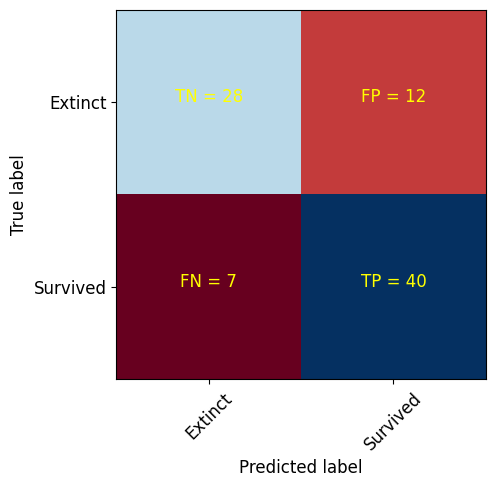

Accuracy=0.782
Recall=0.851 
Precision=0.769
F1=0.808
Average precision-recall score: 0.871


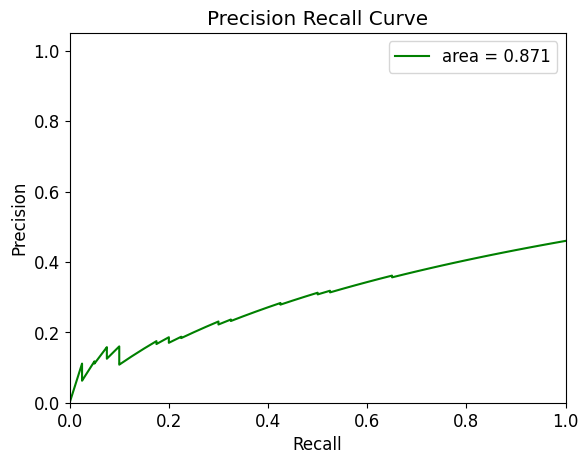

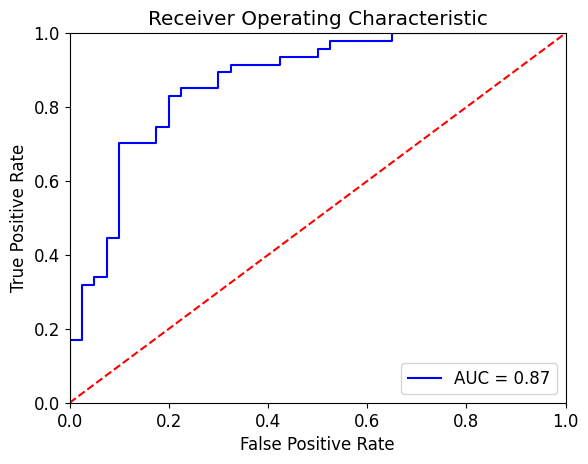

In [11]:
#Make predictions
y_pred = pipeline.predict(X_test)
try:
    scores = pipeline.decision_function(X_test)
except:
    scores = pipeline.predict_proba(X_test)[:,1]

#Make plots
plot_cm(pipeline, y_pred)
plot_aucprc(pipeline, scores)
plot_aucroc(pipeline)

### Tuning

In [3]:
from sklearn.model_selection import GridSearchCV

In [15]:
param_grid = { 'catboost__learning_rate': [0.001, 0.005, 0.01, 0.1], 'catboost__l2_leaf_reg': [1,3,5], 'catboost__depth' : [2,4,6,10] }

In [16]:
Grid_CBC = GridSearchCV(estimator=pipeline, param_grid = param_grid)
Grid_CBC.fit(X_train, y_train)

0:	learn: 0.6929918	total: 2.22ms	remaining: 2.22s
1:	learn: 0.6928962	total: 2.7ms	remaining: 1.35s
2:	learn: 0.6927560	total: 2.96ms	remaining: 984ms
3:	learn: 0.6926094	total: 3.24ms	remaining: 806ms
4:	learn: 0.6924810	total: 3.49ms	remaining: 695ms
5:	learn: 0.6922427	total: 3.75ms	remaining: 621ms
6:	learn: 0.6921005	total: 4.05ms	remaining: 575ms
7:	learn: 0.6919335	total: 4.27ms	remaining: 530ms
8:	learn: 0.6917380	total: 4.5ms	remaining: 495ms
9:	learn: 0.6916069	total: 4.7ms	remaining: 465ms
10:	learn: 0.6914998	total: 5.64ms	remaining: 507ms
11:	learn: 0.6914133	total: 5.97ms	remaining: 492ms
12:	learn: 0.6912615	total: 6.2ms	remaining: 470ms
13:	learn: 0.6910954	total: 6.5ms	remaining: 458ms
14:	learn: 0.6910090	total: 6.74ms	remaining: 443ms
15:	learn: 0.6908546	total: 6.96ms	remaining: 428ms
16:	learn: 0.6907702	total: 7.29ms	remaining: 421ms
17:	learn: 0.6906275	total: 7.49ms	remaining: 409ms
18:	learn: 0.6905443	total: 7.72ms	remaining: 399ms
19:	learn: 0.6903261	total:

GridSearchCV(estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('cat',
                                                                         OneHotEncoder(handle_unknown='ignore'),
                                                                         [0, 1,
                                                                          2, 3,
                                                                          4]),
                                                                        ('num',
                                                                         StandardScaler(),
                                                                         [5, 6,
                                                                          7, 8,
                                                                          9,
                                                                          10])])),
                                       ('catboost',
                                        <catboost.core.CatBoostClassifier object at 0x1420abcd0>)]),
             param_grid={'catboost__depth': [2, 4, 6, 10],
                         'catboost__l2_leaf_reg': [1, 3, 5],
                         'catboost__learning_rate': [0.001, 0.005, 0.01, 0.1]})

In [18]:
result = Grid_CBC.cv_results_
print(result)

{'mean_fit_time': array([  0.30560336,   0.28755383,   0.27866998,   0.28891759,
         0.29379172,   0.31216097,   0.3184597 ,   0.33334637,
         0.32154622,   0.37079568,   0.35066562,   0.36816916,
         0.67811604,   0.69737639,   0.71178389,   0.69538426,
         0.7282836 ,   0.73308177,   0.81875033,   0.80001426,
         0.78896656,   0.78310175,   0.79334455,   0.88329992,
         2.08232965,   1.85134869,   1.84672623,   2.02236743,
         2.04715366,   2.36765456,   2.4983583 ,   1.94944496,
         2.6221344 ,   2.73835015,   2.75924635,   2.4044343 ,
        21.57836828,  21.53804078,  23.27154307,  26.72035418,
        38.43114972, 122.88655343,  40.94922862,  58.7413064 ,
        62.21807389,  26.40075684,  29.25287018,  32.98157425]), 'std_fit_time': array([4.21618841e-02, 1.81418103e-02, 7.78563869e-03, 2.12568202e-02,
       1.31327719e-02, 4.16263375e-02, 3.01531144e-02, 4.84678020e-02,
       3.86536915e-02, 7.45271188e-02, 2.34893750e-02, 2.41680768e

### SHAP

In [9]:
feature_names = df.drop(['survival_status'], axis=1).columns.tolist()
feature_names

['lithology',
 'life_mode',
 'motility',
 'feeding_mode',
 'shell_mineralogy',
 'species_richness',
 'ornamentation',
 'environmental_breadth',
 'geographic_range',
 'occurrence',
 'body_size']

In [20]:
# def model_predict(data_asarray):
#     data_asframe =  pd.DataFrame(data_asarray, columns=feature_names)
#     return pipeline.predict_proba(data_asframe)

In [36]:
# def model_predict(X_test):
#     data_asframe =  pd.DataFrame(X_test, columns=feature_names)
#     return pipeline.predict_proba(data_asframe)

In [37]:
# def model_predict(X_test):
#     return pipeline.predict_proba(X_test)

In [11]:
import shap
shap.initjs()

X does not have valid feature names, but OneHotEncoder was fitted with feature names
X does not have valid feature names, but StandardScaler was fitted with feature names
Using 347 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/87 [00:00<?, ?it/s]

X does not have valid feature names, but OneHotEncoder was fitted with feature names
X does not have valid feature names, but StandardScaler was fitted with feature names
X does not have valid feature names, but OneHotEncoder was fitted with feature names
X does not have valid feature names, but StandardScaler was fitted with feature names
X does not have valid feature names, but OneHotEncoder was fitted with feature names
X does not have valid feature names, but StandardScaler was fitted with feature names
X does not have valid feature names, but OneHotEncoder was fitted with feature names
X does not have valid feature names, but StandardScaler was fitted with feature names
X does not have valid feature names, but OneHotEncoder was fitted with feature names
X does not have valid feature names, but StandardScaler was fitted with feature names
X does not have valid feature names, but OneHotEncoder was fitted with feature names
X does not have valid feature names, but StandardScaler was 

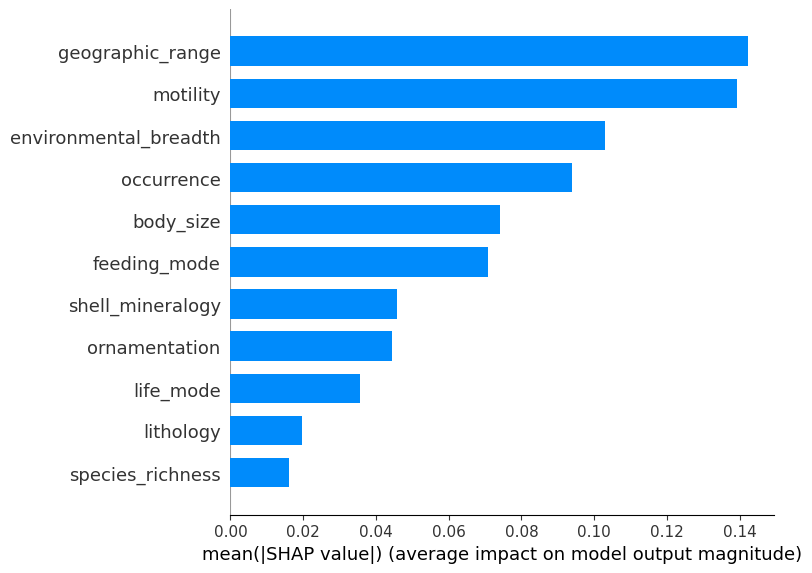

In [53]:
explainer = shap.KernelExplainer(pipeline.predict, X_train)
shap_values = explainer.shap_values(X_test)

features = df.drop(['survival_status'], axis=1).columns.tolist() #not needed for this plot
shap_df = pd.DataFrame(shap_values, columns=pd.Index(features, name='features')) #not needed for this plot

shap.summary_plot(shap_values, X_train, plot_type="bar")

In [65]:
explainer.expected_value

0.5504322766570604

In [66]:
shap_values

array([[ 1.30231920e-02,  1.24250949e-02, -4.72842047e-01,
         2.98065047e-02, -2.81997621e-02,  5.92379123e-04,
         1.33651251e-02, -4.69900736e-03,  7.55992407e-02,
        -2.38039202e-01,  4.85362060e-02],
       [-1.61406157e-02,  1.19264901e-02,  3.68738850e-02,
         2.09642743e-02,  7.40702621e-03, -1.01559855e-01,
         1.03254654e-02, -3.38232469e-01, -3.05363433e-01,
         6.46916884e-02,  5.86752665e-02],
       [-7.39215955e-03,  7.84547825e-02,  1.13715063e-01,
         3.15115960e-02,  3.75314487e-02,  1.75106354e-02,
         3.33218974e-02, -1.13659027e-01, -1.16052559e-01,
         2.66522574e-01,  1.08103472e-01],
       [-6.50930881e-03,  8.12817346e-02,  1.12824207e-01,
         5.36331824e-02,  3.75051462e-02, -5.32340698e-03,
         2.19363250e-02, -7.04267874e-02, -1.51183615e-01,
         1.87683546e-01,  1.88146700e-01],
       [-2.40268057e-03,  3.73610539e-03,  9.97678514e-02,
         4.88541238e-02,  1.95885367e-02,  1.99704954e-02,
  

In [12]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 347 entries, 106 to 19
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   lithology              347 non-null    object 
 1   life_mode              347 non-null    object 
 2   motility               347 non-null    object 
 3   feeding_mode           347 non-null    object 
 4   shell_mineralogy       347 non-null    object 
 5   species_richness       347 non-null    int64  
 6   ornamentation          347 non-null    int64  
 7   environmental_breadth  347 non-null    int64  
 8   geographic_range       347 non-null    int64  
 9   occurrence             347 non-null    int64  
 10  body_size              347 non-null    float64
dtypes: float64(1), int64(5), object(5)
memory usage: 32.5+ KB


In [28]:
#features = X_train.columns.tolist()

In [ ]:
features = pipeline.named_transformers_['cat'].named_steps['ohe'].get_feature_names(categorical_features)

In [31]:
X_train = pipeline.named_steps['preprocessor'].fit_transform(X_train)

In [33]:
X_train_df = pd.DataFrame(X_train, columns=features)

ValueError: Shape of passed values is (347, 22), indices imply (347, 11)

In [18]:
## Store the best fitted classifier and its booster
binary_est = xgb_bin_grid.best_estimator_ # from tuning with GridSearchCV
binary_model = binary_est.named_steps['xgb'].get_booster()
model = pipeline.named_steps['catboost']

In [ ]:
new_explainer= shap.TreeExplainer(model)
shap_vals = new_explainer.shap_values(X_train)

In [24]:
new_explainer= shap.KernelExplainer(pipeline.predict, X_train)
shap_vals = new_explainer.shap_values(X_train)

X does not have valid feature names, but OneHotEncoder was fitted with feature names
X does not have valid feature names, but StandardScaler was fitted with feature names
Using 347 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/347 [00:00<?, ?it/s]

X does not have valid feature names, but OneHotEncoder was fitted with feature names
X does not have valid feature names, but StandardScaler was fitted with feature names
X does not have valid feature names, but OneHotEncoder was fitted with feature names
X does not have valid feature names, but StandardScaler was fitted with feature names
X does not have valid feature names, but OneHotEncoder was fitted with feature names
X does not have valid feature names, but StandardScaler was fitted with feature names
X does not have valid feature names, but OneHotEncoder was fitted with feature names
X does not have valid feature names, but StandardScaler was fitted with feature names
X does not have valid feature names, but OneHotEncoder was fitted with feature names
X does not have valid feature names, but StandardScaler was fitted with feature names
X does not have valid feature names, but OneHotEncoder was fitted with feature names
X does not have valid feature names, but StandardScaler was 

In [25]:
def shap_force(clf, clf_step_name, index, X_train_df, y_train, explainer, shap_vals):
    ## Store model prediction and ground truth label
    pred = clf.named_steps[clf_step_name].predict(X_train_df.iloc[index,:])
    true_label = y_train.iloc[index]
    
    
    ## Assess accuracy of prediction
    if true_label == pred:
        accurate = 'Correct!'
    else:
        accurate = 'Incorrect'
    
    
    ## Print output that checks model's prediction against true label
    print('***'*12)
    # Print ground truth label for row at index
    print(f'Ground Truth Label: {true_label}')
    print()
    # Print model prediction for row at index
    print(f'Model Prediction:  {pred} -- {accurate}')
    print('***'*12)
    print()
    
    
    ## Plot the prediction's explanation
    fig = shap.force_plot(explainer.expected_value,
                              shap_vals[index,:],
                              X_train_df.iloc[index,:])
    
    
    return fig

In [32]:
shap_force(pipeline, 
           'catboost', # name of fitted classifier step in pipeline
           0, X_train, y_train, 
           new_explainer, 
           shap_vals)

AttributeError: 'numpy.ndarray' object has no attribute 'iloc'

In [27]:
X_test

,lithology,life_mode,motility,feeding_mode,shell_mineralogy,species_richness,ornamentation,environmental_breadth,geographic_range,occurrence,body_size
104,siliciclastic,epifaunal,stationary,suspension feeder,aragonite,1,2,1,1,2,3.665039
82,mixed,infaunal,mobile,suspension feeder,aragonite,6,2,5,5,194,4.299424
415,mixed,infaunal,mobile,suspension feeder,aragonite,2,2,4,4,151,4.302487
395,mixed,infaunal,mobile,suspension feeder,aragonite,1,2,3,3,94,4.354230
311,mixed,infaunal,mobile,suspension feeder,aragonite,1,1,1,1,4,2.810904
...,...,...,...,...,...,...,...,...,...,...,...
296,mixed,infaunal,mobile,chemosymbiotic,aragonite,1,2,2,2,30,3.802422
430,mixed,infaunal,mobile,suspension feeder,aragonite,1,1,3,2,15,2.550307
315,mixed,infaunal,mobile,suspension feeder,aragonite,1,2,1,2,26,3.917547
35,siliciclastic,infaunal,mobile,suspension feeder,aragonite,1,1,2,2,43,3.632148


https://datascience.stackexchange.com/questions/52476/how-to-use-shap-kernal-explainer-with-pipeline-models
https://towardsdatascience.com/deep-dive-into-catboost-functionalities-for-model-interpretation-7cdef669aeed

!!!!! https://medium.com/mlearning-ai/shap-force-plots-for-classification-d30be430e195